## Load libraries

In [58]:
# Libraries to work cross-platform
import os

# Libraries to work with dataset
import numpy as np
import pandas as pd
import ast                      # convert string to list after importing csv data
import tmtoolkit
import pickle

# Libraries to cluster data
from gsdmm import MovieGroupProcess
from gensim.corpora import Dictionary

# Libraries to visualize data
import matplotlib.pyplot as plt
import seaborn as sns
from cluster_visualization_helper import (
    visualize_cluster  # user-defined functions
)

# Libraries for evaluation
from sklearn import metrics
import compute_topic_coherence 

# Libraries for monitoring operation process
from tqdm.notebook import tqdm
from datetime import datetime

## Configurate and declare global variables

In [4]:
os_name = os.name

if os_name == 'nt':
    BASE_DIR = "E:/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
    INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
    OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"
elif os_name == 'posix':
    BASE_DIR = "/media/pinkalinux/WORK/THIENDHB_GOOGLEDRIVE/MASTER TILBURG/THESIS/"
    INPUT_DIR = BASE_DIR + "DATASET/INPUT/"
    OUTPUT_DIR = BASE_DIR + "DATASET/OUTPUT/"

SEED = 6886

%matplotlib inline

## Import data

In [5]:
title_embeddings = np.load(OUTPUT_DIR + "title_embeddings.npy")

In [6]:
title_embeddings.shape

(18992, 300)

In [7]:
title_docs = pd.read_csv(OUTPUT_DIR + "title_docs.csv")

In [8]:
title_docs["clean_job_title"] = title_docs["clean_job_title"].apply(ast.literal_eval)

## Clustering data

### Gibbs Sampling Dirichlet Mixture Model (GSDMM)

In [14]:
title_corpus = title_docs["clean_job_title"].values.tolist()
len(title_corpus), list(title_corpus)[:10]

(18992,
 [['chief', 'financial', 'officer'],
  ['full', 'time', 'community', 'connection', 'intern', 'pay', 'internship'],
  ['country', 'coordinator'],
  ['bcc', 'specialist'],
  ['software', 'developer'],
  ['saleswoman'],
  ['chief', 'accountant', 'finance', 'assistant'],
  ['non', 'pay', 'part', 'full', 'time', 'programmatic', 'intern'],
  ['assistant', 'manage', 'director'],
  ['program', 'assistant', 'inl', 'fsn', 'fp']])

In [15]:
title_vocab = set(tmtoolkit.utils.flatten_list(title_corpus))
len(title_vocab), list(title_vocab)[:10]

(2617,
 ['billing',
  'training',
  'course',
  'kumayri',
  'competitive',
  'revival',
  'rmd',
  'mission',
  'emergency',
  'vsa'])

In [70]:
def build_mgp_model(
    X,
    corpus,
    vocab_size,
    K=100,
    alpha=0.1,
    beta=0.1,
    n_iters=50,
    seed=6886,
):
    """
    A MovieGroupProcess is a conceptual model introduced by Yin and Wang 2014 to
    describe their Gibbs sampling algorithm for a Dirichlet Mixture Model for the
    clustering short text documents.
    Reference: http://dbgroup.cs.tsinghua.edu.cn/wangjy/papers/KDD14-GSDMM.pdf
    Imagine a professor is leading a film class. At the start of the class, the students
    are randomly assigned to K tables. Before class begins, the students make lists of
    their favorite films. The teacher reads the role n_iters times. When
    a student is called, the student must select a new table satisfying either:
        1) The new table has more students than the current table.
    OR
        2) The new table has students with similar lists of favorite movies.

    :param K: int
        Upper bound on the number of possible clusters. Typically many fewer
    :param alpha: float between 0 and 1
        Alpha controls the probability that a student will join a table that is currently empty
        When alpha is 0, no one will join an empty table.
    :param beta: float between 0 and 1
        Beta controls the student's affinity for other students with similar interests. A low beta means
        that students desire to sit with students of similar interests. A high beta means they are less
        concerned with affinity and are more influenced by the popularity of a table
    """

#     logging.debug("Start of GSDMM model for job titles")

    np.random.seed(SEED)
    mgp = MovieGroupProcess(K=K, alpha=alpha, beta=beta, n_iters=n_iters)

    """
        MovieGroupProcess().fit: Cluster the input documents
        :param docs: list of list
            list of lists containing the unique token set of each document
        :param V: total vocabulary size for each document
        :return: list of length len(doc)
            cluster label for each document
    """
    mgp_labels = mgp.fit(docs=corpus, vocab_size=vocab_size)

#     logging.debug("End of GSDMM model for job titles")

    return mgp, mgp_labels

## Tuning hyperparameters

In [11]:
# Define search parameters
# k_range = [50, 100, 150]
# alpha_range = [0.01, 0.25, 0.5, 0.75, 1.0]
# beta_range = [0.01, 0.25, 0.5, 0.75, 1.0]
# n_iter_range = [50, 100]
k_range = [150]
alpha_range = [0.01, 0.2, 0.5]
beta_range = [0.01, 0.2, 0.5]
n_iter_range = [50]

print(
    "Total hyperparameters in search space =",
    str(len(k_range) * len(alpha_range) * len(beta_range) * len(n_iter_range)),
)

Total hyperparameters in search space = 9


In [12]:
# # Set up logger for callback

# # Creating logger
# mylogs = logging.getLogger(__name__)
# mylogs.setLevel(logging.NOTSET)

# # Handler - log in file
# log_file = logging.FileHandler(OUTPUT_DIR + "title_gsdmm_model_callbacks.log")
# fileformat = logging.Formatter("%(asctime)s:%(levelname)s:%(message)s")
# log_file.setLevel(logging.NOTSET)
# log_file.setFormatter(fileformat)

# # Handler - log in console
# # stream = logging.StreamHandler()
# # streamformat = logging.Formatter("%(levelname)s:%(module)s:%(message)s")
# # stream.setLevel(logging.NOTSET)
# # stream.setFormatter(streamformat)

# # Adding all handlers to the logs
# mylogs.addHandler(log_file)
# # mylogs.addHandler(stream)
# print = mylogs.info

In [13]:
# # Set up logger for callback
# logging.basicConfig(
# #     filename=OUTPUT_DIR + "skills_lda_model_callbacks.log",
#     handlers=[
#         logging.FileHandler(
#             OUTPUT_DIR + "title_gsdmm_model_callbacks.log", "w", "utf-8"
#         )
#     ],
#     format="%(asctime)s:%(levelname)s:%(message)s",
#     level=logging.NOTSET,
# )

# Create empty list to store labels created by models
labels_list = []
model_list = []
duration_list = []
model_result = {"K": [], "alpha": [], "beta": [], "n_iters": [], "Silhouette": []}

start_loop_time = datetime.now()
print(f"Start loop {start_loop_time.strftime('%Y-%m-%d %H:%M:%S.%f')}")

# Loop through the search space
tqdm_bar = tqdm(
    desc="Tuning GSDMM model",
    total=len(k_range) * len(alpha_range) * len(beta_range) * len(n_iter_range),
)

for K in k_range:
    for alpha in alpha_range:
        for beta in beta_range:
            for n_iters in n_iter_range:
                print(f"K = {K}")
                print(f"alpha = {alpha}")
                print(f"beta = {beta}")
                print(f"n_iters = {n_iters}")

                starttime = datetime.now()
                print(f"Start {starttime.strftime('%Y-%m-%d %H:%M:%S.%f')}")

                mgp_model, mgp_labels = build_mgp_model(
                    X=title_docs,
                    corpus=title_corpus,
                    vocab_size=len(title_vocab),
                    K=K,
                    alpha=alpha,
                    beta=beta,
                    n_iters=n_iters,
                    seed=SEED,
                )

                endtime = datetime.now()
                print(f"End {endtime.strftime('%Y-%m-%d %H:%M:%S.%f')}")
                print(f"Duration {endtime - starttime}")

                duration_list.append(round((endtime - starttime).seconds / 60, 2))
                labels_list.append(mgp_labels)
                model_list.append(mgp_model)

                model_result["K"].append(K)
                model_result["alpha"].append(alpha)
                model_result["beta"].append(beta)
                model_result["n_iters"].append(n_iters)

                # Save model
                pickle.dump(
                    (mgp_model, mgp_labels),
                    open(
                        OUTPUT_DIR
                        + "gsdmm/"
                        + "title_gsdmm_tuning_results_"
                        + "_K-"
                        + str(K)
                        + "_alpha-"
                        + str(alpha)
                        + "_beta-"
                        + str(beta)
                        + "_niters-"
                        + str(n_iters)
                        + ".pkl",
                        "wb",
                    ),
                )

                tqdm_bar.update(1)

tqdm_bar.close()

end_loop_time = datetime.now()
print(f"End loop {end_loop_time.strftime('%Y-%m-%d %H:%M:%S.%f')}")
print(f"Duration {end_loop_time - start_loop_time}")

Tuning GSDMM model:   0%|                                                                        | 0/9 [00:00<?, ?it/s]

Start loop 2021-05-04 18:54:54.005594
K = 150
alpha = 0.01
beta = 0.01
n_iters = 50
Start 2021-05-04 18:54:54.009544
In stage 0: transferred 18060 clusters with 150 clusters populated
In stage 1: transferred 12883 clusters with 150 clusters populated
In stage 2: transferred 9084 clusters with 150 clusters populated
In stage 3: transferred 7395 clusters with 150 clusters populated
In stage 4: transferred 6621 clusters with 150 clusters populated
In stage 5: transferred 6166 clusters with 150 clusters populated
In stage 6: transferred 5923 clusters with 150 clusters populated
In stage 7: transferred 5636 clusters with 150 clusters populated
In stage 8: transferred 5546 clusters with 150 clusters populated
In stage 9: transferred 5340 clusters with 150 clusters populated
In stage 10: transferred 5206 clusters with 150 clusters populated
In stage 11: transferred 5083 clusters with 150 clusters populated
In stage 12: transferred 5173 clusters with 150 clusters populated
In stage 13: transfe

Tuning GSDMM model:  11%|██████▋                                                     | 1/9 [21:27<2:51:39, 1287.50s/it]

K = 150
alpha = 0.01
beta = 0.2
n_iters = 50
Start 2021-05-04 19:16:21.519756
In stage 0: transferred 18540 clusters with 150 clusters populated
In stage 1: transferred 14222 clusters with 150 clusters populated
In stage 2: transferred 8812 clusters with 129 clusters populated
In stage 3: transferred 6559 clusters with 98 clusters populated
In stage 4: transferred 5626 clusters with 75 clusters populated
In stage 5: transferred 5039 clusters with 69 clusters populated
In stage 6: transferred 4790 clusters with 63 clusters populated
In stage 7: transferred 4581 clusters with 58 clusters populated
In stage 8: transferred 4405 clusters with 57 clusters populated
In stage 9: transferred 4289 clusters with 56 clusters populated
In stage 10: transferred 4244 clusters with 54 clusters populated
In stage 11: transferred 4228 clusters with 54 clusters populated
In stage 12: transferred 4205 clusters with 51 clusters populated
In stage 13: transferred 4065 clusters with 50 clusters populated
In 

Tuning GSDMM model:  22%|█████████████▎                                              | 2/9 [39:07<2:14:36, 1153.80s/it]

In stage 49: transferred 3908 clusters with 33 clusters populated
End 2021-05-04 19:34:01.720360
Duration 0:17:40.200604
K = 150
alpha = 0.01
beta = 0.5
n_iters = 50
Start 2021-05-04 19:34:01.720360
In stage 0: transferred 18743 clusters with 150 clusters populated
In stage 1: transferred 14632 clusters with 147 clusters populated
In stage 2: transferred 7578 clusters with 90 clusters populated
In stage 3: transferred 5373 clusters with 45 clusters populated
In stage 4: transferred 4628 clusters with 30 clusters populated
In stage 5: transferred 4245 clusters with 23 clusters populated
In stage 6: transferred 4103 clusters with 20 clusters populated
In stage 7: transferred 3897 clusters with 20 clusters populated
In stage 8: transferred 3713 clusters with 17 clusters populated
In stage 9: transferred 3692 clusters with 17 clusters populated
In stage 10: transferred 3731 clusters with 17 clusters populated
In stage 11: transferred 3578 clusters with 18 clusters populated
In stage 12: tr

Tuning GSDMM model:  33%|████████████████████                                        | 3/9 [56:57<1:51:31, 1115.29s/it]

In stage 49: transferred 3403 clusters with 14 clusters populated
End 2021-05-04 19:51:51.183136
Duration 0:17:49.462776
K = 150
alpha = 0.2
beta = 0.01
n_iters = 50
Start 2021-05-04 19:51:51.183136
In stage 0: transferred 18052 clusters with 150 clusters populated
In stage 1: transferred 13020 clusters with 150 clusters populated
In stage 2: transferred 9407 clusters with 150 clusters populated
In stage 3: transferred 7769 clusters with 150 clusters populated
In stage 4: transferred 6961 clusters with 150 clusters populated
In stage 5: transferred 6562 clusters with 150 clusters populated
In stage 6: transferred 6230 clusters with 150 clusters populated
In stage 7: transferred 6071 clusters with 150 clusters populated
In stage 8: transferred 5863 clusters with 150 clusters populated
In stage 9: transferred 5760 clusters with 150 clusters populated
In stage 10: transferred 5696 clusters with 150 clusters populated
In stage 11: transferred 5664 clusters with 150 clusters populated
In st

Tuning GSDMM model:  44%|█████████████████████████▊                                | 4/9 [1:14:43<1:31:19, 1095.88s/it]

In stage 49: transferred 4849 clusters with 149 clusters populated
End 2021-05-04 20:09:37.281928
Duration 0:17:46.098792
K = 150
alpha = 0.2
beta = 0.2
n_iters = 50
Start 2021-05-04 20:09:37.313432
In stage 0: transferred 18559 clusters with 150 clusters populated
In stage 1: transferred 14060 clusters with 149 clusters populated
In stage 2: transferred 8778 clusters with 120 clusters populated
In stage 3: transferred 6444 clusters with 92 clusters populated
In stage 4: transferred 5593 clusters with 73 clusters populated
In stage 5: transferred 4957 clusters with 70 clusters populated
In stage 6: transferred 4652 clusters with 69 clusters populated
In stage 7: transferred 4471 clusters with 62 clusters populated
In stage 8: transferred 4249 clusters with 60 clusters populated
In stage 9: transferred 4136 clusters with 56 clusters populated
In stage 10: transferred 4067 clusters with 56 clusters populated
In stage 11: transferred 4046 clusters with 54 clusters populated
In stage 12: t

Tuning GSDMM model:  56%|████████████████████████████████▏                         | 5/9 [1:32:19<1:12:06, 1081.63s/it]

In stage 49: transferred 3761 clusters with 45 clusters populated
End 2021-05-04 20:27:13.678274
Duration 0:17:36.364842
K = 150
alpha = 0.2
beta = 0.5
n_iters = 50
Start 2021-05-04 20:27:13.678274
In stage 0: transferred 18712 clusters with 150 clusters populated
In stage 1: transferred 14674 clusters with 147 clusters populated
In stage 2: transferred 7319 clusters with 89 clusters populated
In stage 3: transferred 5291 clusters with 52 clusters populated
In stage 4: transferred 4616 clusters with 39 clusters populated
In stage 5: transferred 4399 clusters with 28 clusters populated
In stage 6: transferred 4066 clusters with 30 clusters populated
In stage 7: transferred 3876 clusters with 25 clusters populated
In stage 8: transferred 3766 clusters with 21 clusters populated
In stage 9: transferred 3647 clusters with 20 clusters populated
In stage 10: transferred 3511 clusters with 23 clusters populated
In stage 11: transferred 3547 clusters with 22 clusters populated
In stage 12: tra

Tuning GSDMM model:  67%|████████████████████████████████████████                    | 6/9 [1:50:04<53:48, 1076.08s/it]

In stage 49: transferred 3362 clusters with 22 clusters populated
End 2021-05-04 20:44:58.968140
Duration 0:17:45.289866
K = 150
alpha = 0.5
beta = 0.01
n_iters = 50
Start 2021-05-04 20:44:58.968140
In stage 0: transferred 18031 clusters with 150 clusters populated
In stage 1: transferred 12979 clusters with 150 clusters populated
In stage 2: transferred 9370 clusters with 150 clusters populated
In stage 3: transferred 7687 clusters with 150 clusters populated
In stage 4: transferred 6893 clusters with 150 clusters populated
In stage 5: transferred 6497 clusters with 150 clusters populated
In stage 6: transferred 6120 clusters with 150 clusters populated
In stage 7: transferred 5962 clusters with 150 clusters populated
In stage 8: transferred 5929 clusters with 150 clusters populated
In stage 9: transferred 5862 clusters with 150 clusters populated
In stage 10: transferred 5740 clusters with 150 clusters populated
In stage 11: transferred 5628 clusters with 150 clusters populated
In st

Tuning GSDMM model:  78%|██████████████████████████████████████████████▋             | 7/9 [2:07:42<35:39, 1069.86s/it]

In stage 49: transferred 4887 clusters with 150 clusters populated
End 2021-05-04 21:02:36.021912
Duration 0:17:37.053772
K = 150
alpha = 0.5
beta = 0.2
n_iters = 50
Start 2021-05-04 21:02:36.037506
In stage 0: transferred 18555 clusters with 150 clusters populated
In stage 1: transferred 14278 clusters with 150 clusters populated
In stage 2: transferred 8841 clusters with 127 clusters populated
In stage 3: transferred 6394 clusters with 100 clusters populated
In stage 4: transferred 5292 clusters with 86 clusters populated
In stage 5: transferred 4843 clusters with 72 clusters populated
In stage 6: transferred 4596 clusters with 66 clusters populated
In stage 7: transferred 4465 clusters with 64 clusters populated
In stage 8: transferred 4351 clusters with 63 clusters populated
In stage 9: transferred 4198 clusters with 61 clusters populated
In stage 10: transferred 4102 clusters with 56 clusters populated
In stage 11: transferred 4038 clusters with 52 clusters populated
In stage 12: 

Tuning GSDMM model:  89%|█████████████████████████████████████████████████████▎      | 8/9 [2:25:21<17:46, 1066.54s/it]

In stage 49: transferred 3972 clusters with 49 clusters populated
End 2021-05-04 21:20:15.458271
Duration 0:17:39.420765
K = 150
alpha = 0.5
beta = 0.5
n_iters = 50
Start 2021-05-04 21:20:15.473895
In stage 0: transferred 18698 clusters with 150 clusters populated
In stage 1: transferred 14771 clusters with 147 clusters populated
In stage 2: transferred 7277 clusters with 91 clusters populated
In stage 3: transferred 4872 clusters with 50 clusters populated
In stage 4: transferred 3980 clusters with 38 clusters populated
In stage 5: transferred 3682 clusters with 33 clusters populated
In stage 6: transferred 3631 clusters with 36 clusters populated
In stage 7: transferred 3506 clusters with 33 clusters populated
In stage 8: transferred 3448 clusters with 34 clusters populated
In stage 9: transferred 3398 clusters with 39 clusters populated
In stage 10: transferred 3325 clusters with 26 clusters populated
In stage 11: transferred 3373 clusters with 26 clusters populated
In stage 12: tra

Tuning GSDMM model: 100%|████████████████████████████████████████████████████████████| 9/9 [2:43:12<00:00, 1088.03s/it]

In stage 49: transferred 3337 clusters with 29 clusters populated
End 2021-05-04 21:38:06.269313
Duration 0:17:50.795418
End loop 2021-05-04 21:38:06.269313
Duration 2:43:12.263719


In [ ]:
# np.vstack(
#     (
#         np.unique(gsdmm_cluster_labels, return_counts=True)[0],
#         np.unique(gsdmm_cluster_labels, return_counts=True)[1],
#     )
# ).T

In [ ]:
# # Plot the log-likelihood
# plt.figure(figsize=(12, 8))
# plt.plot(n_range, score_list, "-o", color="brown")
# plt.xlabel("Number of Components")
# plt.ylabel("Log-likelihood")
# plt.xticks(n_range)
# plt.title("Average log-likelihood of BGM models")
# plt.grid()

In [ ]:
# i = 0
# silho_table = {"K": [], "alpha": [], "beta": [], "n_iters": [], "Silhouette": []}

# for K in k_range:
#     #     print('K =', K)
#     for alpha in alpha_range:
#         #         print('alpha =', alpha)
#         for beta in beta_range:
#             #             print('beta =', beta)
#             for n_iters in n_iter_range:
#                 #                 print('n_iters =', n_iters)
#                 #                 print("i =", i)
#                 silho_score = metrics.silhouette_score(title_embeddings, labels_list[i])
#                 silho_table["K"].append(K)
#                 silho_table["alpha"].append(alpha)
#                 silho_table["beta"].append(beta)
#                 silho_table["n_iters"].append(n_iters)
#                 silho_table["Silhouette"].append(silho_score)
#                 i += 1

# # pd.DataFrame(silho_table)

## Evaluate clustering performance

In [14]:
# Calculate Silhouette score
for idx, _ in tqdm(enumerate(model_list)):
    silho_score = metrics.silhouette_score(title_embeddings, labels_list[idx])
    model_result["Silhouette"].append(silho_score)

9it [00:49,  5.51s/it]


In [15]:
def get_average_score(models, docs):
    avg_score_list = []
    for model in models:
        score_list = []
        for doc in docs:
            score = model.score(doc)
            score_list.append(score)
#             print(score_list)
            avg_score = np.mean(score_list)
#             print(avg_score)
        avg_score_list.append(avg_score)
    return avg_score_list

In [16]:
# Create average score
avg_scores = get_average_score(model_list, title_docs)
# print(avg_scores)
model_result['Average Score'] = avg_scores

In [17]:
pd.DataFrame(model_result)
# model_result

,K,alpha,beta,n_iters,Silhouette,Average Score
0,150,0.01,0.01,50,0.025197,0.006667
1,150,0.01,0.20,50,-0.004558,0.006667
2,150,0.01,0.50,50,-0.002868,0.006667
3,150,0.20,0.01,50,0.016594,0.006667
4,150,0.20,0.20,50,-0.004394,0.006667
5,150,0.20,0.50,50,-0.047888,0.006667
6,150,0.50,0.01,50,0.016587,0.006667
7,150,0.50,0.20,50,-0.014711,0.006667
8,150,0.50,0.50,50,-0.065373,0.006667


In [29]:
# Save tuning results to file
model_result_df = pd.DataFrame(model_result)
model_result_df.to_csv(
    OUTPUT_DIR + "gsdmm/" + "job-title_gsdmm-tuning-results.csv", index=False
)

In [30]:
# Combine model sets
tuple_objects = (
    k_range,
    alpha_range,
    beta_range,
    model_list,
    duration_list,
    labels_list,
    model_result_df
)
len(tuple_objects), len(tuple_objects[0])

(7, 1)

In [31]:
# Save tuple
pickle.dump(tuple_objects, open(OUTPUT_DIR + "gsdmm/" + "title_gsdmm_tuning_results.pkl", "wb"))

In [12]:
(
    k_range,
    alpha_range,
    beta_range,
    model_list,
    duration_list,
    labels_list,
    model_result_df
) = pickle.load(open(OUTPUT_DIR + "gsdmm/" + "title_gsdmm_tuning_results.pkl", "rb"))

In [13]:
(
    k_range,
    alpha_range,
    beta_range,
    len(model_list),
    len(duration_list),
    len(labels_list),
    model_result_df.shape
)

([150], [0.01, 0.2, 0.5], [0.01, 0.2, 0.5], 9, 9, 9, (9, 6))

In [16]:
model_result_df

,K,alpha,beta,n_iters,Silhouette,Average Score
0,150,0.01,0.01,50,0.025197,0.006667
1,150,0.01,0.20,50,-0.004558,0.006667
2,150,0.01,0.50,50,-0.002868,0.006667
3,150,0.20,0.01,50,0.016594,0.006667
4,150,0.20,0.20,50,-0.004394,0.006667
5,150,0.20,0.50,50,-0.047888,0.006667
6,150,0.50,0.01,50,0.016587,0.006667
7,150,0.50,0.20,50,-0.014711,0.006667
8,150,0.50,0.50,50,-0.065373,0.006667


In [61]:
import importlib
importlib.reload(compute_topic_coherence)

<module 'compute_topic_coherence' from 'e:\\THIENDHB_GOOGLEDRIVE\\MASTER TILBURG\\THESIS\\CODES\\compute_topic_coherence.py'>

In [56]:
def coherence_measure(title_corpus, numDocuments, nTopics, selected_topics):
    # Build corpus
    id2word = Dictionary(title_corpus)
    corpus1 = [id2word.doc2bow(doc) for doc in title_corpus]
    # print('corpus1:', len(corpus1), corpus1[:5])
    corpus = compute_topic_coherence.build_corpus(corpus1=corpus1, N=20)

    # Retrieve word counts per topic
    topicWordCount = compute_topic_coherence.getTopicWordCount(nTopics=nTopics, id2word=id2word, numDocuments=numDocuments, corpus=corpus)
    # print('topicWordCount:', len(topicWordCount), len(topicWordCount[0]), topicWordCount[0][:5])

    # Retrieve top words per topic
    coherence_index_all, coherence_word_all = compute_topic_coherence.getTopTopicalWords(selected_topics=selected_topics, topicWordCount=topicWordCount, id2word=id2word, twords=10)
    # print('coherence_word_all:', len(coherence_word_all), len(coherence_word_all[0]), coherence_word_all[0][:5])
    # print('coherence_index_all:', len(coherence_index_all), len(coherence_index_all[0]), coherence_index_all[0][:5])

    # Compute coherence score:
    coherence_score = compute_topic_coherence.coherence(corpus=corpus, coherence_index_all=coherence_index_all, nTopics=nTopics)

    return coherence_score, coherence_index_all, coherence_word_all, topicWordCount

In [62]:
# Compute coherence score for each topic model in list
coherence_score_list = []
coherence_index_list = []
coherence_word_list = []
topicWordCount_list = []
numDocuments = len(title_docs)

pbar = tqdm(desc="Compute coherence score", total=len(labels_list))
for i in range(len(labels_list)):
    selected_topics = np.unique(labels_list[i])
    # print('selected_topics', selected_topics)
    nTopics = len(selected_topics)
    pbar.set_description("Compute coherence score of model " + str(i) + " with " + str(nTopics+1) + " topics")
    coherence_score, coherence_index_all, coherence_word_all, topicWordCount = coherence_measure(title_corpus, numDocuments, nTopics, selected_topics)
    coherence_score_list.append(coherence_score)
    coherence_index_list.append(coherence_index_all)
    coherence_word_list.append(coherence_word_all)
    topicWordCount_list.append(topicWordCount)
    pbar.update(1)
pbar.close()

Compute coherence score:   0%|          | 0/9 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/150 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 150 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/150 [00:00<?, ?it/s]

coherence_word_all: 150 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 150 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/150 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/33 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 33 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/33 [00:00<?, ?it/s]

coherence_word_all: 33 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 33 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/33 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/14 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 14 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/14 [00:00<?, ?it/s]

coherence_word_all: 14 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 14 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/14 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/149 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 149 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/149 [00:00<?, ?it/s]

coherence_word_all: 149 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 149 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/149 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/45 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 45 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/45 [00:00<?, ?it/s]

coherence_word_all: 45 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 45 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/45 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/22 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 22 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/22 [00:00<?, ?it/s]

coherence_word_all: 22 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 22 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/22 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/150 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 150 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/150 [00:00<?, ?it/s]

coherence_word_all: 150 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 150 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/150 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/49 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 49 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/49 [00:00<?, ?it/s]

coherence_word_all: 49 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 49 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/49 [00:00<?, ?it/s]

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/29 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 29 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/29 [00:00<?, ?it/s]

coherence_word_all: 29 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 29 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/29 [00:00<?, ?it/s]

In [63]:
coherence_score_list

[-86.46438584885132,
 -86.46438584885134,
 -86.46438584885134,
 -86.46438584885132,
 -86.46438584885134,
 -86.46438584885132,
 -86.46438584885132,
 -86.46438584885132,
 -86.46438584885132]

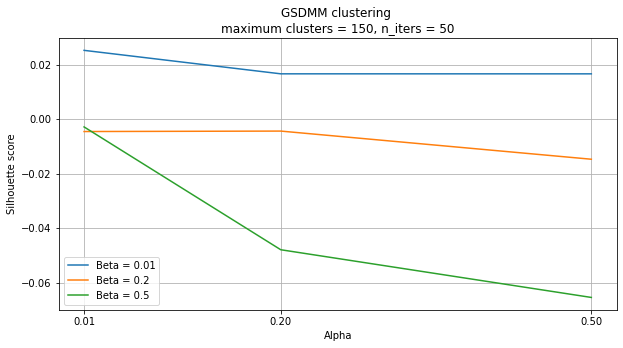

In [64]:
# Plot the Silhouette score
plt.figure(figsize=(10, 5))
for idb, b in enumerate(beta_range):
    plt.plot(
        model_result_df["alpha"].loc[model_result_df["beta"] == b],
        model_result_df["Silhouette"].loc[model_result_df["beta"] == b],
        label=f"Beta = {b}",
    )
    plt.title(
        "GSDMM clustering \n"
        + "maximum clusters = "
        + str(int(model_result_df.loc[0, ["K"]]))
        + ", n_iters = "
        + str(int(model_result_df.loc[0, ["n_iters"]]))
    )
    plt.legend(loc="best")
    plt.xlabel("Alpha")
    plt.xticks(alpha_range)
    plt.ylabel("Silhouette score")
    plt.grid()
plt.show()

In [51]:
# Read the log info of training passes
training_df = pd.read_csv(OUTPUT_DIR + 'gsdmm/title_gsdmm_training_results.csv')
training_df

,pass,K,alpha,beta,n_iters,duration,start_time,end_time,transfered_clusters,number_clusters
0,0,150,0.01,0.01,50,0:21:27.082779,2021-05-04 18:54:54.009544,2021-05-04 19:16:21.092323,18060,150
1,1,150,0.01,0.01,50,0:21:27.082779,2021-05-04 18:54:54.009544,2021-05-04 19:16:21.092323,12883,150
2,2,150,0.01,0.01,50,0:21:27.082779,2021-05-04 18:54:54.009544,2021-05-04 19:16:21.092323,9084,150
3,3,150,0.01,0.01,50,0:21:27.082779,2021-05-04 18:54:54.009544,2021-05-04 19:16:21.092323,7395,150
4,4,150,0.01,0.01,50,0:21:27.082779,2021-05-04 18:54:54.009544,2021-05-04 19:16:21.092323,6621,150
...,...,...,...,...,...,...,...,...,...,...
445,45,150,0.50,0.50,50,0:17:50.795418,2021-05-04 21:20:15.473895,2021-05-04 21:38:06.269313,3289,33
446,46,150,0.50,0.50,50,0:17:50.795418,2021-05-04 21:20:15.473895,2021-05-04 21:38:06.269313,3207,29
447,47,150,0.50,0.50,50,0:17:50.795418,2021-05-04 21:20:15.473895,2021-05-04 21:38:06.269313,3194,27
448,48,150,0.50,0.50,50,0:17:50.795418,2021-05-04 21:20:15.473895,2021-05-04 21:38:06.269313,3295,20


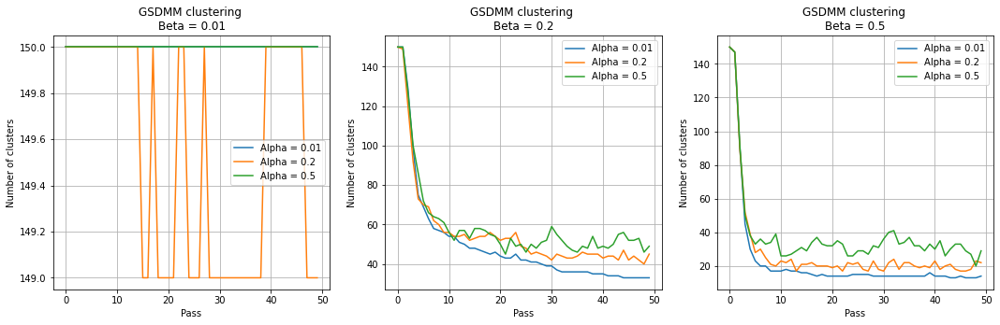

In [65]:
# Plot the number of cluster during training passes
plt.figure(figsize=(18, 5))
for idb, b in enumerate(beta_range):
    plot_df = training_df.loc[training_df["beta"] == b]
    plt.subplot(1, len(beta_range), idb+1)
    for ida, a in enumerate(alpha_range):
        plt.plot(
            plot_df["pass"].loc[plot_df["alpha"] == a],
            plot_df["number_clusters"].loc[plot_df["alpha"] == a],
            label=f"Alpha = {a}",
        )
    plt.title(
        "GSDMM clustering \n"
        + "Beta = " + str(b)
    )
    plt.legend(loc="best")
    plt.xlabel("Pass")
#     plt.xticks(np.unique(training_df['pass']))
    plt.ylabel("Number of clusters")
    plt.grid()
plt.show()

In [67]:
# Select best model base on Silhouette score
best_index = np.argmax(model_result_df["Silhouette"])
# best_n = len(np.unique(labels_list[best_index]))
# best_model = model_list[best_index]
# best_labels = labels_list[best_index]
best_params = model_result_df.iloc[best_index]
best_index, best_params

(0,
 K                150.000000
 alpha              0.010000
 beta               0.010000
 n_iters           50.000000
 Silhouette         0.025197
 Average Score      0.006667
 Name: 0, dtype: float64)

In [68]:
model_result_df['K'][best_index]

150

In [72]:
best_model, best_labels = build_mgp_model(
    X=title_docs,
    corpus=title_corpus,
    vocab_size=len(title_vocab),
    K=model_result_df['K'][best_index],
    alpha=model_result_df['alpha'][best_index],
    beta=model_result_df['beta'][best_index],
    n_iters=10,
    seed=SEED,
)

In stage 0: transferred 18060 clusters with 150 clusters populated
In stage 1: transferred 12883 clusters with 150 clusters populated
In stage 2: transferred 9084 clusters with 150 clusters populated
In stage 3: transferred 7395 clusters with 150 clusters populated
In stage 4: transferred 6621 clusters with 150 clusters populated
In stage 5: transferred 6166 clusters with 150 clusters populated
In stage 6: transferred 5923 clusters with 150 clusters populated
In stage 7: transferred 5636 clusters with 150 clusters populated
In stage 8: transferred 5546 clusters with 150 clusters populated
In stage 9: transferred 5340 clusters with 150 clusters populated


In [73]:
best_n = len(np.unique(best_labels))
best_n

150

In [74]:
selected_topics = np.unique(best_labels)
# print('selected_topics', selected_topics)
nTopics = len(selected_topics)
coherence_score, coherence_index_all, coherence_word_all, topicWordCount = coherence_measure(title_corpus, numDocuments, nTopics, selected_topics)
coherence_score

corpus1: 18992 [[(0, 1), (1, 1), (2, 1)], [(3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1)], [(10, 1), (11, 1)], [(12, 1), (13, 1)], [(14, 1), (15, 1)]]


Build corpus:   0%|          | 0/18992 [00:00<?, ?it/s]

Initialize topicWordCount:   0%|          | 0/150 [00:00<?, ?it/s]

Update number of occurences of word:   0%|          | 0/18992 [00:00<?, ?it/s]

topicWordCount: 150 2617 [4187.238095238091, 2531.6428571428582, 5208.730158730163, 281.04761904761904, 15.857142857142858]


Get Top words of topics:   0%|          | 0/150 [00:00<?, ?it/s]

coherence_word_all: 150 10 ['manager', 'specialist', 'developer', 'engineer', 'accountant']
coherence_index_all: 150 10 [42, 13, 14, 195, 17]


Compute topic coherence:   0%|          | 0/150 [00:00<?, ?it/s]

-86.46438584885132

## Visualize clustering result

In [75]:
pca_datapoint = np.load(OUTPUT_DIR + "visualization/" + "pca_datapoints.npy")
tsne_datapoint = np.load(OUTPUT_DIR + "visualization/" + "tsne_datapoints.npy")

Start PCA 2021-05-08 01:08:41.848427
End PCA 2021-05-08 01:08:41.854388
PCA duration 0:00:00.005961

Start t-SNE 2021-05-08 01:08:41.854388
End t-SNE 2021-05-08 01:08:41.860433
t-SNE duration 0:00:00.006045



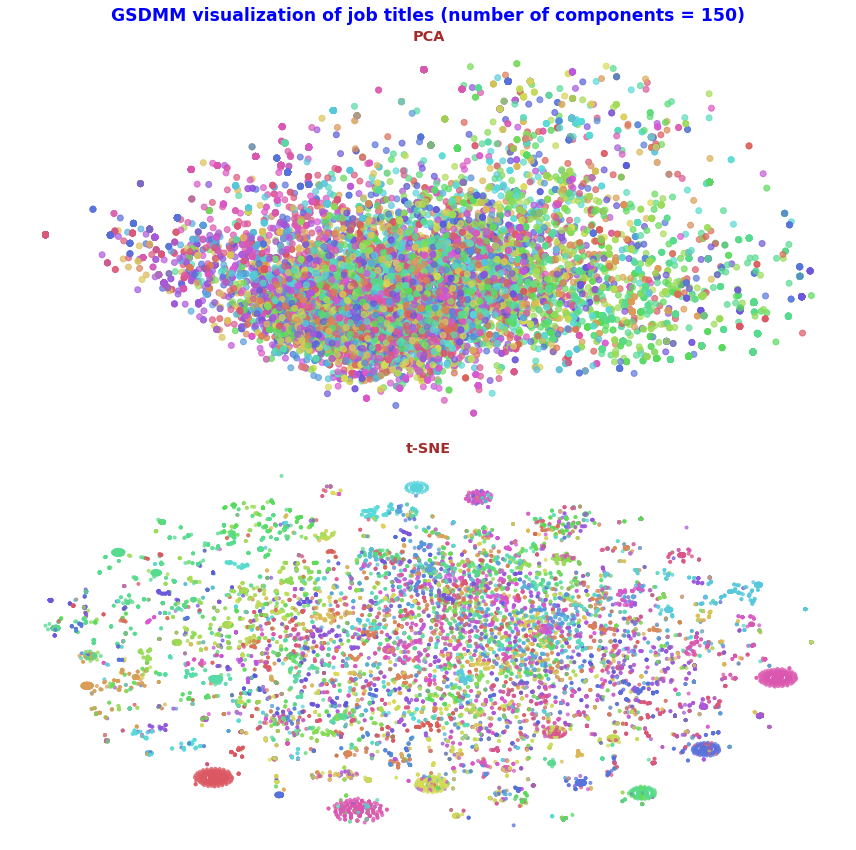

In [76]:
plot_title = f"GSDMM visualization of job titles (number of components = {best_n})"
palette = sns.color_palette("hls", as_cmap=True)
colors = np.asarray(best_labels) / best_n

# Visualize clusters with PCA and t-SNE
visualize_cluster(
    plot_title,
    (12, 12),
    colors,
    palette,
    pca_datapoint,
    tsne_datapoint,
    None,
    pca=True,
    tsne=True,
    mds=False
)

## Save cluster results to file

In [77]:
np.save(OUTPUT_DIR + "gsdmm/" + "job-title_gsdmm-clusters.csv", best_labels)